In [108]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import pickle
import seaborn as sns
import pandas as pd

from sklearn.svm import SVC
from sklearn.utils import shuffle
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import StratifiedKFold
from collections import defaultdict
from skimage.feature import hog, local_binary_pattern

# Bisindo Sign Language Classification

This notebook implements a hand gesture classification system using:
1. **Various Descriptors** - SIFT, RootSIFT, Akaze, ORB, HOG, LBP
2. **Bag of Visual Words (BoVW)** - Feature encoding using K-Means clustering
3. **Support Vector Classifier (SVC)** - Multi-class classification

## Classes
- A - Z and Background

In [109]:
DATA_PATH = 'dataset'
CLASSES = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']
NUM_CLASSES = len(CLASSES)

N_CLUSTERS = 100  # Reduced from 500 to prevent overfitting
MAX_FEATURES = 150  # Reduced from 500 for better generalization
TEST_SIZE = 0.2
RANDOM_STATE = 67

## 1. Define descriptors

In [110]:
class RootSIFT:
    def __init__(self, sift=None):
        self.sift = sift

    def detectAndCompute(self, image, param):
        keypoints, descriptors = self.sift.detectAndCompute(image, None)

        if descriptors is None:
            return keypoints, None

        descriptors /= (np.linalg.norm(descriptors, ord=1, axis=1, keepdims=True) + 1e-7)
        descriptors = np.sqrt(descriptors)
        return keypoints, descriptors.astype(np.float32)

class HOGDescriptor:
    def __init__(self, orientations=9, pixels_per_cell=(32, 32), cells_per_block=(2, 2)):
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
    
    def compute(self, image):
        features = hog(image, orientations=self.orientations,
                      pixels_per_cell=self.pixels_per_cell,
                      cells_per_block=self.cells_per_block,
                      block_norm='L2-Hys', feature_vector=True)
        return features.astype(np.float32)

class LBPDescriptor:
    def __init__(self, radius=3, n_points=24):
        self.radius = radius
        self.n_points = n_points
    
    def compute(self, image):
        lbp = local_binary_pattern(image, self.n_points, self.radius, method='uniform')
        n_bins = self.n_points + 2
        hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins), density=True)
        return hist.astype(np.float32)

sift = cv2.SIFT_create(nfeatures=MAX_FEATURES)
rootsift = RootSIFT(sift=sift)
akaze = cv2.AKAZE_create()
orb = cv2.ORB_create(nfeatures=MAX_FEATURES)
hog_desc = HOGDescriptor()
lbp_desc = LBPDescriptor()

## 2. Load Dataset

In [111]:
def load_images(folder):
    images = []
    for f in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, f))
        images.append(img)
    return images

images, labels = [], []
for idx, cls in enumerate(CLASSES):
    class_imgs = load_images(os.path.join(DATA_PATH, cls))
    images.extend(class_imgs)
    labels.extend([idx] * len(class_imgs))
    print(f"{cls}: {len(class_imgs)} images")

print(f"\nTotal: {len(images)} images")

A: 20 images
B: 20 images
C: 20 images
D: 20 images
E: 20 images
F: 20 images
G: 20 images
H: 20 images
I: 20 images
J: 20 images
K: 20 images
L: 20 images
M: 20 images
N: 20 images
O: 20 images
P: 20 images
Q: 20 images
R: 20 images
S: 20 images
T: 20 images
U: 20 images
V: 20 images
W: 20 images
X: 20 images
Y: 20 images
Z: 20 images

Total: 520 images


## 3. Preprocess Image + Augmentation

In [112]:
def resize_image(img, target_size=(256, 256)):
    return cv2.resize(img, target_size)

In [113]:
resized_images = []

for img in tqdm(images, desc="Resizing"):
    resized_img = resize_image(img)
    resized_images.append(resized_img)

Resizing: 100%|██████████| 520/520 [02:24<00:00,  3.61it/s]


In [114]:
import cv2
import numpy as np
import random

def augment_image(img):
    augmented = [img]
    h, w = img.shape[:2]
    center = (w // 2, h // 2)

    # 1. Horizontal flip
    augmented.append(cv2.flip(img, 1))

    # 2. Rotation (-15°, +15°)
    for angle in [-15, -10, 10, 15]:
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated = cv2.warpAffine(
            img, M, (w, h),
            borderMode=cv2.BORDER_REFLECT
        )
        augmented.append(rotated)

    # 3. Brightness & Contrast
    for alpha, beta in [(0.7, 0), (1.3, 0), (1.1, 10), (0.9, -10)]:
        adjusted = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)
        augmented.append(adjusted)

    # 4. Gaussian Blur (camera focus variation)
    for k in [3, 5]:
        blurred = cv2.GaussianBlur(img, (k, k), 0)
        augmented.append(blurred)

    # 5. Gaussian Noise (sensor noise)
    noise = np.random.normal(0, 10, img.shape).astype(np.uint8)
    noisy = cv2.add(img, noise)
    augmented.append(noisy)

    # 6. Random Translation (small shift)
    for dx, dy in [(-10, 0), (10, 0), (0, -10), (0, 10)]:
        M = np.float32([[1, 0, dx], [0, 1, dy]])
        shifted = cv2.warpAffine(
            img, M, (w, h),
            borderMode=cv2.BORDER_REFLECT
        )
        augmented.append(shifted)

    # 7. Zoom (scale in / out)
    for scale in [0.9, 1.1]:
        M = cv2.getRotationMatrix2D(center, 0, scale)
        zoomed = cv2.warpAffine(
            img, M, (w, h),
            borderMode=cv2.BORDER_REFLECT
        )
        augmented.append(zoomed)

    return augmented


In [115]:
# Keep only original images (no augmentation yet)
# Augmentation will be applied ONLY to training folds during cross-validation
all_images = resized_images.copy()
all_labels = labels.copy()

print(f"Total original images: {len(all_images)} (augmentation will be applied during training)")

Total original images: 520 (augmentation will be applied during training)


In [116]:
def preprocess_image(img):
    if img is None:
        return None
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.GaussianBlur(gray, (3, 3), 0)
    return gray_blur

In [117]:
# Preprocess original images only
preprocessed_images = []

for img in tqdm(all_images, desc="Preprocessing"):
    preprocessed_img = preprocess_image(img)
    preprocessed_images.append(preprocessed_img)

print(f"Total preprocessed images: {len(preprocessed_images)}")

Preprocessing: 100%|██████████| 520/520 [00:00<00:00, 2173.44it/s]

Total preprocessed images: 520


In [118]:
len(preprocessed_images)

520

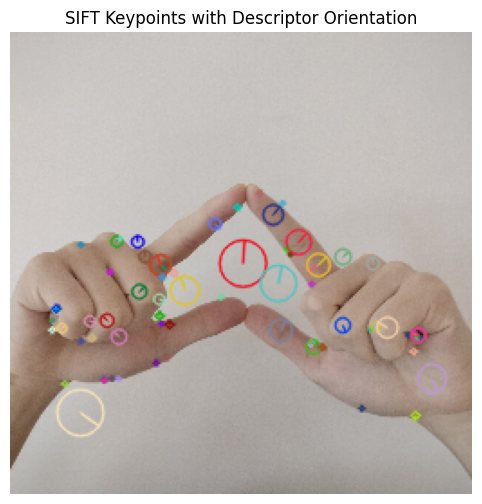

In [119]:
kps, prep = rootsift.detectAndCompute(all_images[0 ], None)

img_test = cv2.drawKeypoints(all_images[0 ], kps, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB))
plt.title("SIFT Keypoints with Descriptor Orientation")
plt.axis('off')
plt.show()

In [120]:
def extract_features(images, descriptor):
  descriptors_list = []

  for img in tqdm(images, desc="Extracting features"):
    _, desc = descriptor.detectAndCompute(img, None)
    descriptors_list.append(desc)
  return descriptors_list

In [121]:
# Extract features from ORIGINAL images only (no augmentation yet)
# Features will be re-extracted with augmentation during training

descriptors_list_sift = extract_features(preprocessed_images, sift)
descriptors_list_rootsift = extract_features(preprocessed_images, rootsift)
descriptors_list_akaze = extract_features(preprocessed_images, akaze)
descriptors_list_orb = extract_features(preprocessed_images, orb)

X_hog = np.array([hog_desc.compute(img) for img in tqdm(preprocessed_images, desc="Extracting HOG")])
X_lbp = np.array([lbp_desc.compute(img) for img in tqdm(preprocessed_images, desc="Extracting LBP")])
y_hog = np.array(all_labels)
y_lbp = np.array(all_labels)

print(f"HOG feature shape: {X_hog.shape}")
print(f"LBP feature shape: {X_lbp.shape}")
print("Note: Keypoint features will be processed during cross-validation with augmentation")

Extracting LBP: 100%|██████████| 520/520 [00:23<00:00, 22.02it/s]

HOG feature shape: (520, 1764)
LBP feature shape: (520, 26)
Note: Keypoint features will be processed during cross-validation with augmentation


In [122]:
# Skip vocabulary building here - will be done during cross-validation
print("Vocabulary building will be done during cross-validation with augmented training data")

Vocabulary building will be done during cross-validation with augmented training data


In [123]:
def create_histogram(descriptors, kmeans, n_clusters):
    if descriptors is None:
        return np.zeros(n_clusters)
    words = kmeans.predict(descriptors)
    hist, _ = np.histogram(words, bins=range(n_clusters + 1))
    return hist / (np.linalg.norm(hist) + 1e-7)

In [124]:
# Skip histogram creation here - will be done during cross-validation
print("Histogram creation will be done during cross-validation with proper train/val split")

Histogram creation will be done during cross-validation with proper train/val split


## 6. Cross-Validation Training with Sample Size Analysis

### Configuration
- **K-Fold Cross-Validation**: 5 folds
- **Sample Sizes per Class**: 1, 5, 10, 20, 50, 100, full dataset
- **Evaluation Metric**: Accuracy

In [139]:
K_FOLDS = 5
SAMPLE_SIZES = [5, 10, 15, 20]  # Simplified: focus on your 20 samples and full dataset

# Store preprocessed images and descriptors for efficient processing
RAW_DATA = {
    'images': preprocessed_images,
    'labels': np.array(all_labels),
    'descriptors_sift': descriptors_list_sift,
    'descriptors_rootsift': descriptors_list_rootsift,
    'descriptors_akaze': descriptors_list_akaze,
    'descriptors_orb': descriptors_list_orb,
    'hog': X_hog,
    'lbp': X_lbp
}

DESCRIPTORS = {
    'SIFT': {'type': 'keypoint', 'descriptor': sift},
    'RootSIFT': {'type': 'keypoint', 'descriptor': rootsift},
    'AKAZE': {'type': 'keypoint', 'descriptor': akaze},
    'ORB': {'type': 'keypoint', 'descriptor': orb},
    'HOG': {'type': 'global', 'descriptor': hog_desc},
    'LBP': {'type': 'global', 'descriptor': lbp_desc},
}

print(f"Cross-Validation Configuration:")
print(f"  K-Folds: {K_FOLDS}")
print(f"  Sample Sizes: {SAMPLE_SIZES}")
print(f"  Original images: {len(preprocessed_images)}")

Cross-Validation Configuration:
  K-Folds: 5
  Sample Sizes: [5, 10, 15, 20]
  Original images: 520


In [140]:
def extract_and_augment_fold(indices, images, labels, desc_type, desc_name, augment=True):
    """Extract features from a fold with optional augmentation"""
    fold_images = []
    fold_labels = []
    
    # Collect images and apply augmentation if needed
    for idx in indices:
        img = images[idx]
        label = labels[idx]
        
        fold_images.append(img)
        fold_labels.append(label)
        
        if augment:
            # Apply augmentation to training data only
            augmented = augment_image(cv2.cvtColor(img, cv2.COLOR_GRAY2BGR))
            for aug_img in augmented[1:]:  # Skip first (original)
                aug_gray = preprocess_image(aug_img)
                fold_images.append(aug_gray)
                fold_labels.append(label)
    
    # Extract features based on descriptor type
    if desc_type == 'keypoint':
        descriptor = DESCRIPTORS[desc_name]['descriptor']
        desc_list = []
        for img in fold_images:
            _, desc = descriptor.detectAndCompute(img, None)
            desc_list.append(desc)
        return desc_list, fold_labels
    else:
        # Global descriptors (HOG, LBP)
        descriptor = DESCRIPTORS[desc_name]['descriptor']
        features = np.array([descriptor.compute(img) for img in fold_images])
        return features, fold_labels


def train_with_proper_pipeline(desc_name, sample_size, k_folds=5):
    """Complete training pipeline with proper K-Fold -> Augment -> Scale"""
    
    desc_type = DESCRIPTORS[desc_name]['type']
    images = RAW_DATA['images']
    labels = RAW_DATA['labels']
    
    sampled_indices = []
    for cls in range(NUM_CLASSES):
        cls_indices = np.where(labels == cls)[0]
        n_samples = min(sample_size, len(cls_indices))
        selected = np.random.choice(cls_indices, size=n_samples, replace=False)
        sampled_indices.extend(selected)
    sampled_indices = np.array(sampled_indices)
    images = [images[i] for i in sampled_indices]
    labels = labels[sampled_indices]
    
    # K-Fold Cross-Validation
    skf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=RANDOM_STATE)
    fold_accuracies = []
    best_model = None
    best_scaler = None
    best_kmeans = None
    best_acc = 0.0
    
    for fold_idx, (train_idx, val_idx) in enumerate(skf.split(images, labels)):
        # 1. AUGMENT TRAINING FOLD ONLY
        if desc_type == 'keypoint':
            train_desc_list, train_labels = extract_and_augment_fold(
                train_idx, images, labels, desc_type, desc_name, augment=True
            )
            val_desc_list, val_labels = extract_and_augment_fold(
                val_idx, images, labels, desc_type, desc_name, augment=False
            )
            
            # Build vocabulary from training descriptors
            all_train_desc = np.vstack([d for d in train_desc_list if d is not None])
            kmeans = MiniBatchKMeans(n_clusters=N_CLUSTERS, random_state=RANDOM_STATE, batch_size=1000)
            kmeans.fit(all_train_desc)
            
            # Create histograms
            X_train = np.array([create_histogram(d, kmeans, N_CLUSTERS) for d in train_desc_list])
            X_val = np.array([create_histogram(d, kmeans, N_CLUSTERS) for d in val_desc_list])
            y_train, y_val = np.array(train_labels), np.array(val_labels)
        else:
            # Global descriptors
            X_train, train_labels = extract_and_augment_fold(
                train_idx, images, labels, desc_type, desc_name, augment=True
            )
            X_val, val_labels = extract_and_augment_fold(
                val_idx, images, labels, desc_type, desc_name, augment=False
            )
            y_train, y_val = np.array(train_labels), np.array(val_labels)
            kmeans = None
        
        # 2. SCALE FEATURES
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)
        
        # 3. TRAIN SVM
        svc = SVC(kernel='rbf', C=1.0, gamma='scale', probability=True,
                  class_weight='balanced', random_state=RANDOM_STATE)
        svc.fit(X_train_scaled, y_train)
        
        # 4. EVALUATE
        y_pred = svc.predict(X_val_scaled)
        accuracy = accuracy_score(y_val, y_pred)
        fold_accuracies.append(accuracy)
        
        if accuracy > best_acc:
            best_acc = accuracy
            best_model = svc
            best_scaler = scaler
            best_kmeans = kmeans
    
    return fold_accuracies, best_model, best_scaler, best_kmeans

In [141]:
results = defaultdict(lambda: defaultdict(dict))
best_models = defaultdict(dict)

print("=" * 60)
print("PROPER PIPELINE: K-Fold → Augment Training Only → Scale")
print("=" * 60)

for desc_name in DESCRIPTORS.keys():
    print(f"\n{'='*50}")
    print(f"Descriptor: {desc_name}")
    print(f"{'='*50}")
    
    for sample_size in SAMPLE_SIZES:
        sample_label = sample_size if sample_size != 'full' else f"full ({len(RAW_DATA['labels'])//NUM_CLASSES})"
        print(f"\nSample size per class: {sample_label}")
        
        fold_accuracies, best_model, best_scaler, best_kmeans = train_with_proper_pipeline(
            desc_name, sample_size, k_folds=K_FOLDS
        )
        
        mean_acc = np.mean(fold_accuracies)
        std_acc = np.std(fold_accuracies)
        
        results[desc_name][sample_size] = {
            'fold_accuracies': fold_accuracies,
            'mean_accuracy': mean_acc,
            'std_accuracy': std_acc,
            'n_folds': len(fold_accuracies)
        }
        
        best_models[desc_name][sample_size] = {
            'model': best_model,
            'scaler': best_scaler,
            'kmeans': best_kmeans
        }
        
        print(f"  Mean Accuracy: {mean_acc:.4f} ± {std_acc:.4f}")
        print(f"  All folds: {[f'{acc:.4f}' for acc in fold_accuracies]}")

print(f"\n{'='*60}")
print("Training Complete!")
print(f"{'='*60}")

PROPER PIPELINE: K-Fold → Augment Training Only → Scale

Descriptor: SIFT

Sample size per class: 5


c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y

  Mean Accuracy: 0.8615 ± 0.0392
  All folds: ['0.8077', '0.8462', '0.9231', '0.8462', '0.8846']

Sample size per class: 10
  Mean Accuracy: 0.9154 ± 0.0288
  All folds: ['0.9038', '0.8654', '0.9423', '0.9423', '0.9231']

Sample size per class: 15
  Mean Accuracy: 0.9282 ± 0.0276
  All folds: ['0.9103', '0.9359', '0.8846', '0.9615', '0.9487']

Sample size per class: 20
  Mean Accuracy: 0.9250 ± 0.0165
  All folds: ['0.9038', '0.9231', '0.9519', '0.9327', '0.9135']

Descriptor: RootSIFT

Sample size per class: 5


c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y

  Mean Accuracy: 0.8462 ± 0.0487
  All folds: ['0.8462', '0.8462', '0.7692', '0.9231', '0.8462']

Sample size per class: 10
  Mean Accuracy: 0.9385 ± 0.0188
  All folds: ['0.9615', '0.9231', '0.9231', '0.9231', '0.9615']

Sample size per class: 15
  Mean Accuracy: 0.9359 ± 0.0269
  All folds: ['0.8974', '0.9615', '0.9487', '0.9103', '0.9615']

Sample size per class: 20
  Mean Accuracy: 0.9519 ± 0.0192
  All folds: ['0.9808', '0.9423', '0.9231', '0.9519', '0.9615']

Descriptor: AKAZE

Sample size per class: 5


c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y

  Mean Accuracy: 0.7462 ± 0.0308
  All folds: ['0.8077', '0.7308', '0.7308', '0.7308', '0.7308']

Sample size per class: 10
  Mean Accuracy: 0.8577 ± 0.0377
  All folds: ['0.7885', '0.8462', '0.8846', '0.8846', '0.8846']

Sample size per class: 15
  Mean Accuracy: 0.9128 ± 0.0221
  All folds: ['0.8974', '0.8846', '0.9103', '0.9231', '0.9487']

Sample size per class: 20
  Mean Accuracy: 0.9308 ± 0.0330
  All folds: ['0.8846', '0.9038', '0.9712', '0.9327', '0.9615']

Descriptor: ORB

Sample size per class: 5


c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y

  Mean Accuracy: 0.7385 ± 0.0449
  All folds: ['0.6923', '0.7308', '0.7692', '0.8077', '0.6923']

Sample size per class: 10
  Mean Accuracy: 0.8500 ± 0.0477
  All folds: ['0.8654', '0.8269', '0.9038', '0.8846', '0.7692']

Sample size per class: 15
  Mean Accuracy: 0.9051 ± 0.0310
  All folds: ['0.8718', '0.8846', '0.9359', '0.9487', '0.8846']

Sample size per class: 20
  Mean Accuracy: 0.9135 ± 0.0161
  All folds: ['0.9327', '0.8942', '0.9231', '0.9231', '0.8942']

Descriptor: HOG

Sample size per class: 5


c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y

  Mean Accuracy: 0.8308 ± 0.0308
  All folds: ['0.8462', '0.8077', '0.8846', '0.8077', '0.8077']

Sample size per class: 10
  Mean Accuracy: 0.9308 ± 0.0335
  All folds: ['0.9808', '0.9423', '0.9423', '0.8846', '0.9038']

Sample size per class: 15
  Mean Accuracy: 0.9462 ± 0.0205
  All folds: ['0.9744', '0.9231', '0.9231', '0.9487', '0.9615']

Sample size per class: 20
  Mean Accuracy: 0.9596 ± 0.0094
  All folds: ['0.9519', '0.9712', '0.9519', '0.9712', '0.9519']

Descriptor: LBP

Sample size per class: 5
  Mean Accuracy: 0.1000 ± 0.0308
  All folds: ['0.1154', '0.0769', '0.0769', '0.1538', '0.0769']

Sample size per class: 10
  Mean Accuracy: 0.1692 ± 0.0308
  All folds: ['0.2115', '0.1346', '0.1346', '0.1731', '0.1923']

Sample size per class: 15
  Mean Accuracy: 0.2154 ± 0.0249
  All folds: ['0.2308', '0.2179', '0.2308', '0.1667', '0.2308']

Sample size per class: 20
  Mean Accuracy: 0.2365 ± 0.0216
  All folds: ['0.2692', '0.2404', '0.2404', '0.2019', '0.2308']

Training Complete!

## 7. Visualization

### Line Plot: Accuracy vs Number of Training Samples

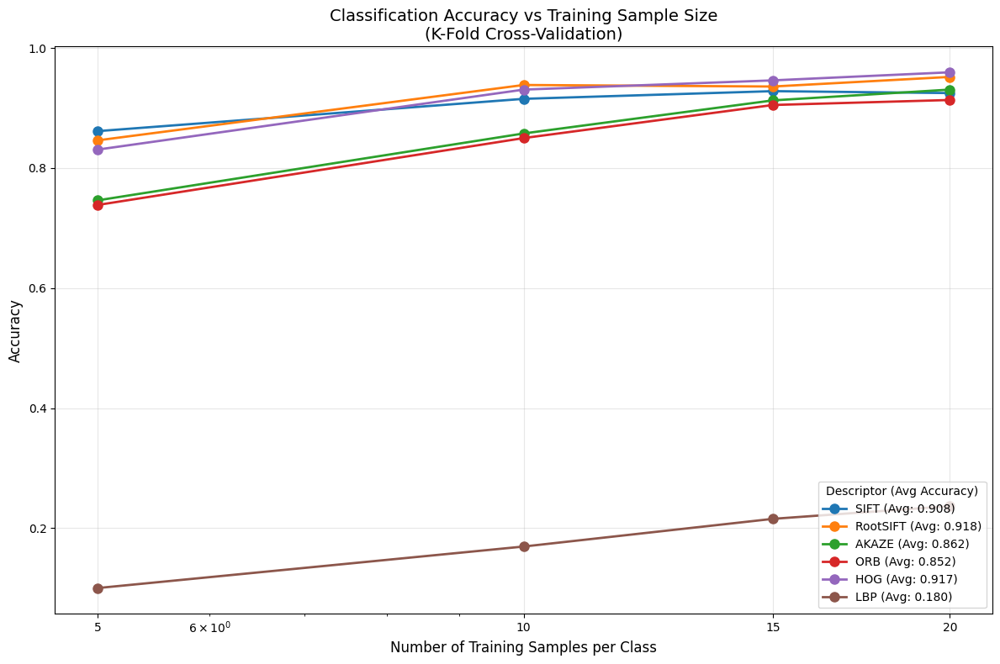

In [142]:
COLORS = {
    'SIFT': '#1f77b4',     
    'RootSIFT': '#ff7f0e',  
    'AKAZE': '#2ca02c',     
    'ORB': '#d62728',     
    'HOG': '#9467bd',       
    'LBP': '#8c564b',       
}

full_samples_per_class = len(all_labels) // NUM_CLASSES
numeric_sample_sizes = [s if s != 'full' else full_samples_per_class for s in SAMPLE_SIZES]

plt.figure(figsize=(12, 8))

for desc_name in DESCRIPTORS.keys():
    means = []
    stds = []
    
    for sample_size in SAMPLE_SIZES:
        res = results[desc_name][sample_size]
        means.append(res['mean_accuracy'])
        stds.append(res['std_accuracy'])
    
    means = np.array(means)
    stds = np.array(stds)
    
    avg_accuracy = np.mean(means)
    
    plt.plot(numeric_sample_sizes, means, 'o-', color=COLORS[desc_name], 
             linewidth=2, markersize=8, 
             label=f'{desc_name} (Avg: {avg_accuracy:.3f})')

plt.xlabel('Number of Training Samples per Class', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Classification Accuracy vs Training Sample Size\n(K-Fold Cross-Validation)', fontsize=14)
plt.legend(loc='lower right', fontsize=10, title='Descriptor (Avg Accuracy)')
plt.grid(True, alpha=0.3)
plt.xscale('log')

plt.xticks(numeric_sample_sizes, [str(s) if s != 'full' else f'Full\n({full_samples_per_class})' for s in SAMPLE_SIZES])

plt.tight_layout()
plt.savefig('accuracy_vs_samples_lineplot.png', dpi=300, bbox_inches='tight')
plt.show()

### Bar Plot: Descriptor Comparison (Mean Accuracy with Standard Deviation)

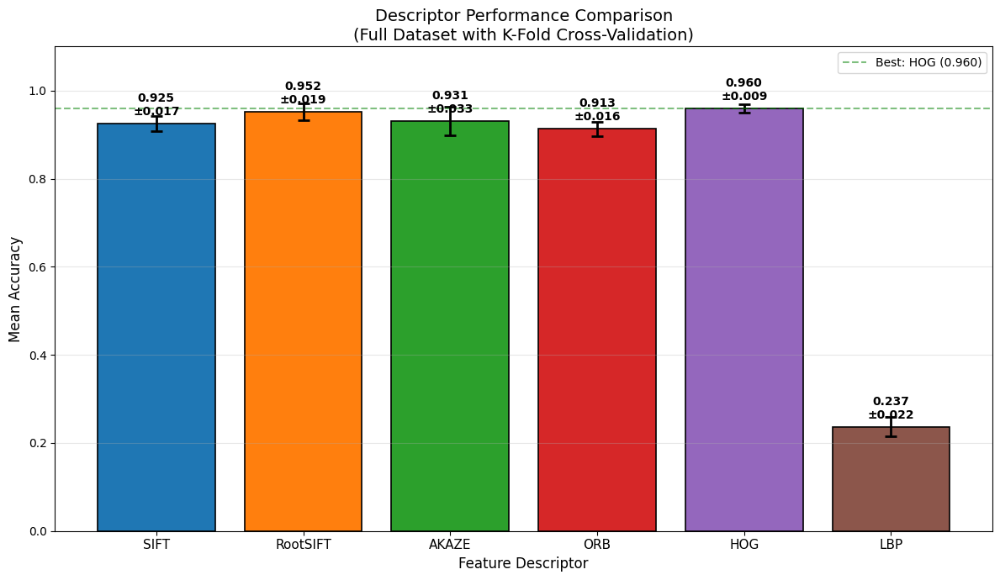

In [145]:
desc_names = list(DESCRIPTORS.keys())
overall_means = []
overall_stds = []

for desc_name in desc_names:
    res = results[desc_name][20]
    overall_means.append(res['mean_accuracy'])
    overall_stds.append(res['std_accuracy'])

fig, ax = plt.subplots(figsize=(12, 7))

x_pos = np.arange(len(desc_names))
bars = ax.bar(x_pos, overall_means, yerr=overall_stds, 
              color=[COLORS[name] for name in desc_names],
              capsize=5, edgecolor='black', linewidth=1.2,
              error_kw={'elinewidth': 2, 'capthick': 2})

for bar, mean, std in zip(bars, overall_means, overall_stds):
    height = bar.get_height()
    ax.annotate(f'{mean:.3f}\n±{std:.3f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 5),
                textcoords="offset points",
                ha='center', va='bottom', fontsize=10, fontweight='bold')

ax.set_xlabel('Feature Descriptor', fontsize=12)
ax.set_ylabel('Mean Accuracy', fontsize=12)
ax.set_title('Descriptor Performance Comparison\n(Full Dataset with K-Fold Cross-Validation)', fontsize=14)
ax.set_xticks(x_pos)
ax.set_xticklabels(desc_names, fontsize=11)
ax.set_ylim(0, 1.1)
ax.grid(axis='y', alpha=0.3)

best_idx = np.argmax(overall_means)
ax.axhline(y=overall_means[best_idx], color='green', linestyle='--', alpha=0.5, 
           label=f'Best: {desc_names[best_idx]} ({overall_means[best_idx]:.3f})')
ax.legend(loc='upper right')

plt.tight_layout()
plt.savefig('descriptor_comparison_barplot.png', dpi=300, bbox_inches='tight')
plt.show()

### Heatmap: Accuracy by Descriptor and Sample Size

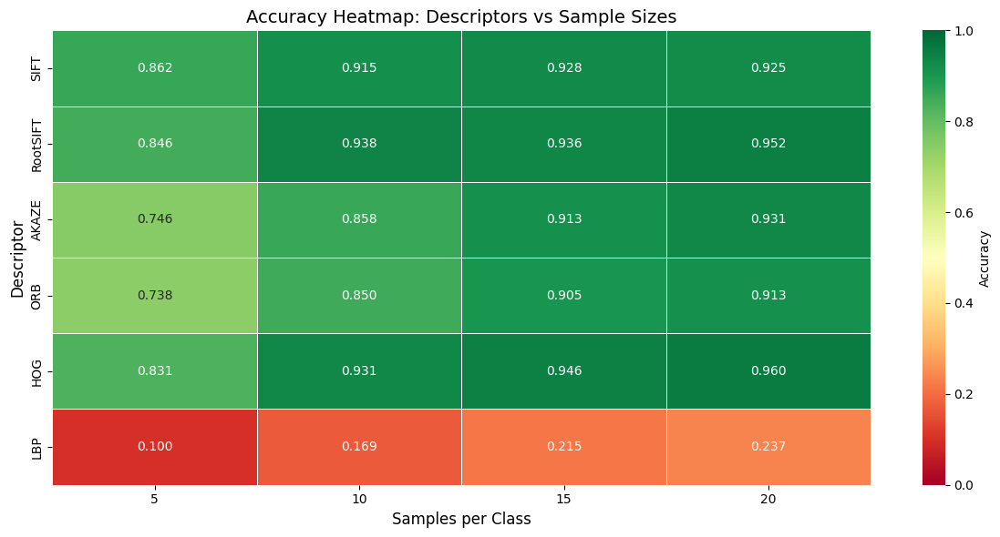

In [146]:
heatmap_data = []
sample_labels = [str(s) if s != 'full' else 'Full' for s in SAMPLE_SIZES]

for desc_name in desc_names:
    row = [results[desc_name][s]['mean_accuracy'] for s in SAMPLE_SIZES]
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data, index=desc_names, columns=sample_labels)

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_df, annot=True, fmt='.3f', cmap='RdYlGn', 
            vmin=0, vmax=1, linewidths=0.5, cbar_kws={'label': 'Accuracy'})
plt.xlabel('Samples per Class', fontsize=12)
plt.ylabel('Descriptor', fontsize=12)
plt.title('Accuracy Heatmap: Descriptors vs Sample Sizes', fontsize=14)
plt.tight_layout()
plt.savefig('accuracy_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

## 8. Save Best Models and Results

In [148]:
os.makedirs('models', exist_ok=True)

def save_model(name, model_dict, results_info=None):
    model_data = {
        'svc': model_dict['model'],
        'scaler': model_dict['scaler'],
        'kmeans': model_dict['kmeans'],
        'descriptor_name': name,
        'results': results_info
    }
    filepath = f'models/rps_classifier_{name.lower()}_best.pkl'
    with open(filepath, 'wb') as f:
        pickle.dump(model_data, f)
    print(f"  ✓ {name}: {results_info['mean_accuracy']:.4f} ± {results_info['std_accuracy']:.4f}")
    return filepath

saved_models = {}
print("\nSaving best models (trained on full dataset):\n")

for desc_name in DESCRIPTORS.keys():
    model_dict = best_models[desc_name][20]
    results_info = results[desc_name][20]
    
    if model_dict['model'] is not None:
        filepath = save_model(desc_name, model_dict, results_info)
        saved_models[desc_name] = filepath

print(f"\n✓ {len(saved_models)} models saved to 'models/' directory")


Saving best models (trained on full dataset):

  ✓ SIFT: 0.9250 ± 0.0165
  ✓ RootSIFT: 0.9519 ± 0.0192
  ✓ AKAZE: 0.9308 ± 0.0330
  ✓ ORB: 0.9135 ± 0.0161
  ✓ HOG: 0.9596 ± 0.0094
  ✓ LBP: 0.2365 ± 0.0216

✓ 6 models saved to 'models/' directory


In [149]:
def load_model(filename):
    try:
        with open(filename, 'rb') as f:
            model_data = pickle.load(f)
        
        svc = model_data['svc']
        scaler = model_data.get('scaler', None)
        kmeans = model_data.get('kmeans', None)
        desc_name = model_data.get('descriptor_name', 'Unknown')
        
        print(f"Loaded model: {desc_name}")
        return svc, scaler, kmeans
    except Exception as e:
        print(f"Error loading model: {e}")
        return None, None, None

## 8. Classify New Images

In [150]:
def classify_image(image_path, descriptor, scaler, kmeans=None, svc=None, local_descriptor=True):
    img = cv2.imread(image_path)
    
    img_resized = cv2.resize(img, (256, 256))
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.GaussianBlur(gray, (3, 3), 0)

    if local_descriptor:
        _, desc = descriptor.detectAndCompute(gray_blur, None)
        hist = create_histogram(desc, kmeans, N_CLUSTERS)
    else:
        hist = descriptor.compute(gray_blur)

    # Scale features before prediction
    hist_scaled = scaler.transform([hist])
    probs = svc.predict_proba(hist_scaled)[0]
    pred_idx = np.argmax(probs)
    pred_class = CLASSES[pred_idx]
    confidence = probs[pred_idx]

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
    plt.title(f"{pred_class.upper()} ({confidence:.1%})", fontsize=14)
    plt.axis('off')
    plt.show()
    
    print(f"  Probabilities: ", end="")
    for i, cls in enumerate(CLASSES):
        print(f"{cls}={probs[i]:.1%} ", end="")
    print()

    return pred_class, confidence

In [151]:
svc_sift, scaler_sift, kmeans_sift = load_model('models/rps_classifier_sift_best.pkl')
svc_rootsift, scaler_rootsift, kmeans_rootsift = load_model('models/rps_classifier_rootsift_best.pkl')
svc_akaze, scaler_akaze, kmeans_akaze = load_model('models/rps_classifier_akaze_best.pkl')
svc_orb, scaler_orb, kmeans_orb = load_model('models/rps_classifier_orb_best.pkl')
svc_hog, scaler_hog, _ = load_model('models/rps_classifier_hog_best.pkl')
svc_lbp, scaler_lbp, _ = load_model('models/rps_classifier_lbp_best.pkl')

Loaded model: SIFT
Loaded model: RootSIFT
Loaded model: AKAZE
Loaded model: ORB
Loaded model: HOG
Loaded model: LBP


In [152]:
def show_keypoints(path):
    img = cv2.imread(path)

    resized_img = resize_image(img)
    kps, desc = rootsift.detectAndCompute(resized_img, None)

    img_test = cv2.drawKeypoints(resized_img, kps, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB))
    plt.title("SIFT Keypoints with Descriptor Orientation")
    plt.axis('off')
    plt.show()


Testing: IMG20251215100521.jpg


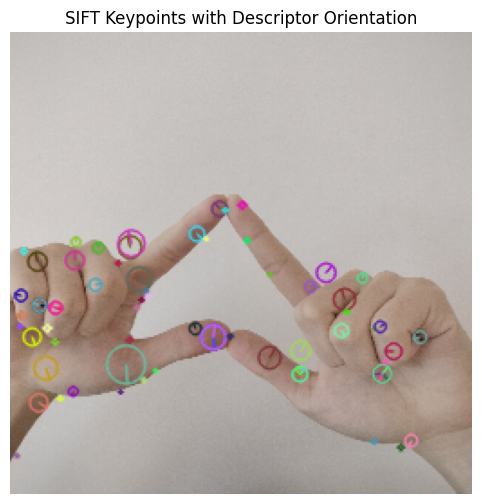

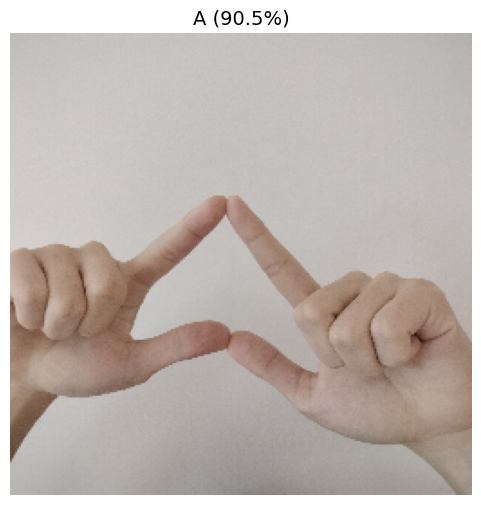

  Probabilities: A=90.5% B=2.0% C=0.5% D=0.8% E=0.0% F=0.2% G=0.1% H=0.2% I=0.0% J=0.3% K=0.0% L=0.1% M=0.1% N=0.7% O=1.3% P=0.0% Q=0.2% R=0.3% S=0.8% T=0.6% U=0.6% V=0.2% W=0.2% X=0.0% Y=0.2% Z=0.1% 

Testing: IMG20251215102610.jpg


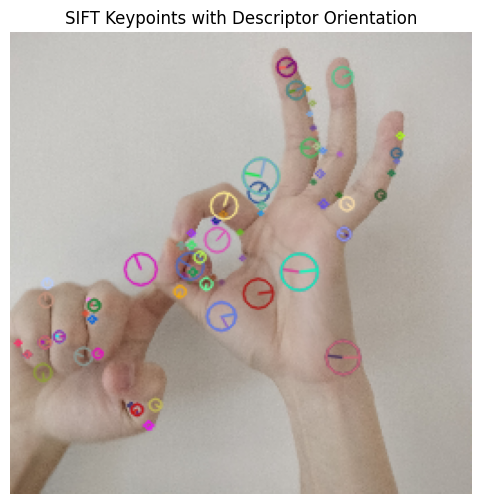

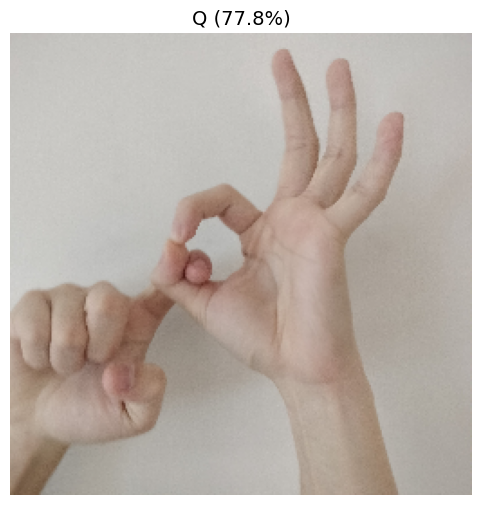

  Probabilities: A=0.7% B=0.5% C=2.6% D=0.7% E=0.1% F=0.4% G=0.8% H=0.3% I=2.4% J=1.7% K=0.1% L=0.3% M=1.4% N=1.2% O=0.2% P=2.9% Q=77.8% R=1.0% S=1.0% T=0.4% U=0.2% V=0.4% W=0.8% X=0.3% Y=1.4% Z=0.3% 

Testing: IMG20251215144620.jpg


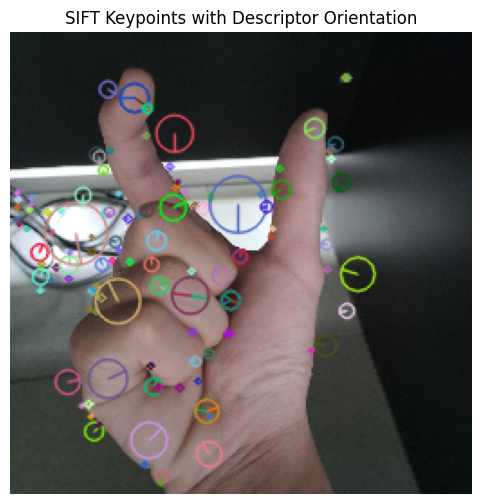

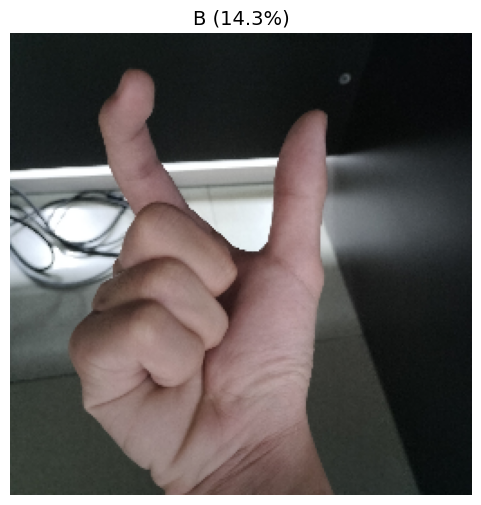

  Probabilities: A=1.6% B=14.3% C=5.0% D=7.8% E=0.1% F=9.9% G=1.5% H=5.9% I=10.4% J=1.7% K=0.3% L=1.6% M=0.3% N=0.7% O=7.0% P=0.6% Q=10.0% R=3.3% S=0.7% T=2.6% U=0.9% V=2.5% W=0.7% X=0.3% Y=1.7% Z=8.4% 

Testing: IMG20251215144652.jpg


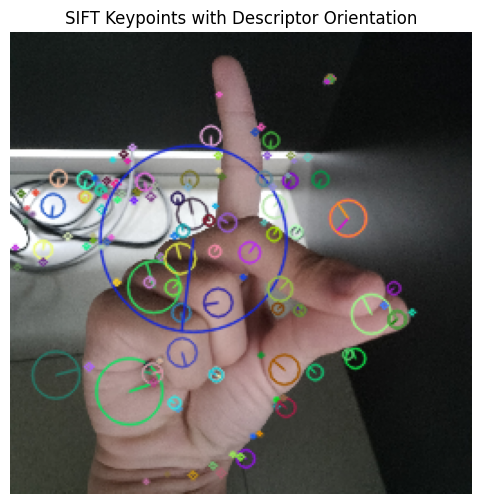

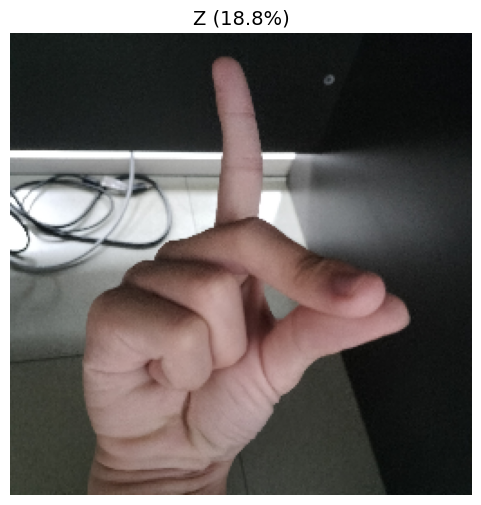

  Probabilities: A=10.2% B=10.0% C=3.0% D=6.5% E=0.2% F=10.2% G=0.5% H=4.9% I=4.6% J=1.2% K=0.7% L=0.6% M=1.5% N=2.0% O=5.4% P=0.2% Q=4.7% R=3.8% S=1.1% T=3.6% U=1.2% V=2.9% W=0.3% X=0.6% Y=1.1% Z=18.8% 

Testing: IMG20251215144705.jpg


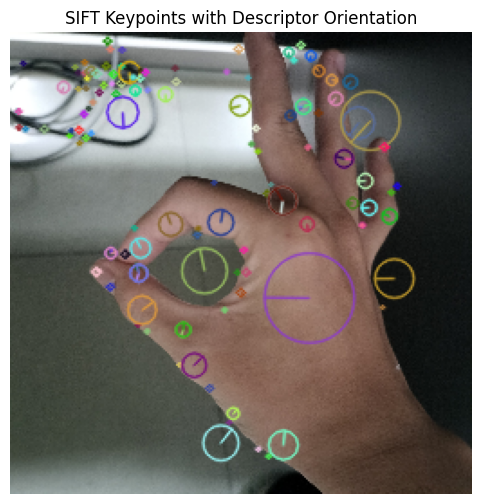

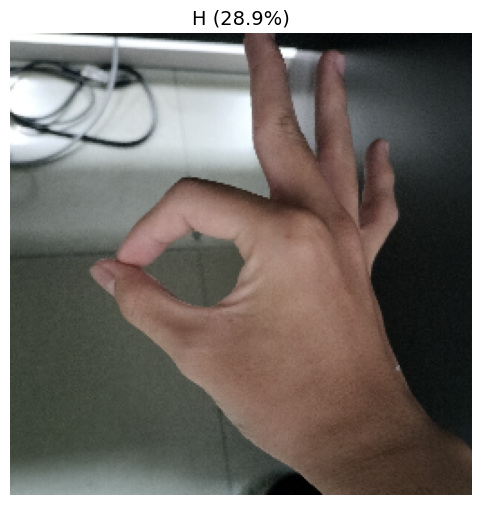

  Probabilities: A=6.6% B=4.5% C=3.3% D=5.7% E=0.3% F=13.0% G=1.7% H=28.9% I=5.1% J=0.5% K=0.7% L=0.5% M=0.8% N=0.8% O=7.6% P=0.7% Q=3.9% R=2.7% S=1.6% T=2.6% U=1.2% V=1.8% W=0.3% X=0.3% Y=1.0% Z=3.8% 

Testing: IMG20251215144841.jpg


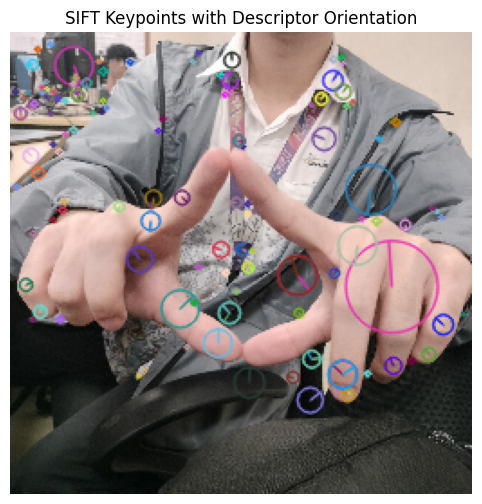

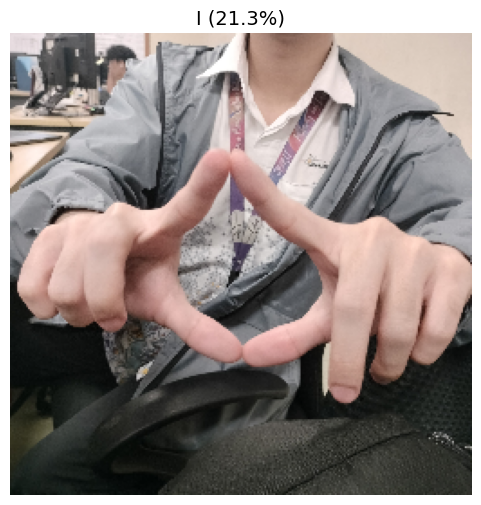

  Probabilities: A=1.5% B=2.1% C=0.4% D=0.7% E=0.1% F=2.6% G=0.3% H=1.6% I=21.3% J=1.0% K=0.9% L=0.3% M=0.9% N=0.9% O=14.9% P=0.6% Q=17.1% R=5.4% S=0.2% T=0.9% U=1.7% V=8.5% W=0.2% X=0.2% Y=6.8% Z=8.8% 

Testing: IMG20251215144919.jpg


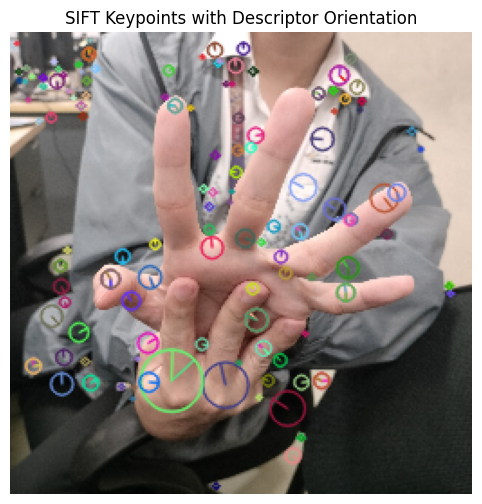

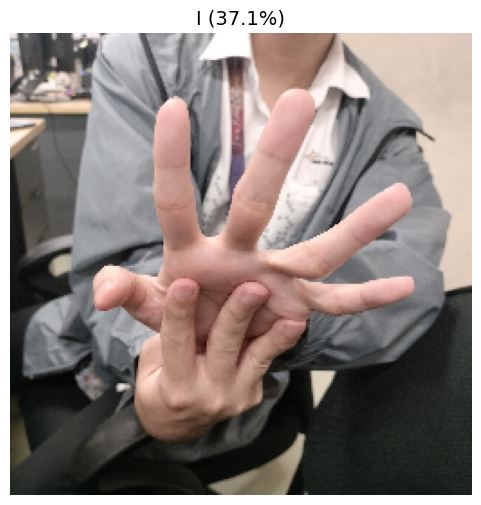

  Probabilities: A=0.6% B=4.0% C=0.5% D=0.8% E=0.1% F=9.2% G=0.8% H=3.7% I=37.1% J=1.6% K=1.3% L=0.4% M=0.6% N=0.5% O=8.0% P=1.1% Q=11.1% R=2.6% S=0.4% T=0.7% U=1.1% V=1.8% W=0.5% X=0.6% Y=2.1% Z=9.1% 

Testing: IMG20251215144948.jpg


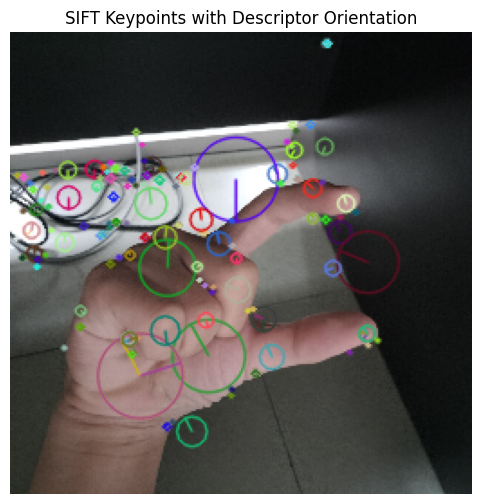

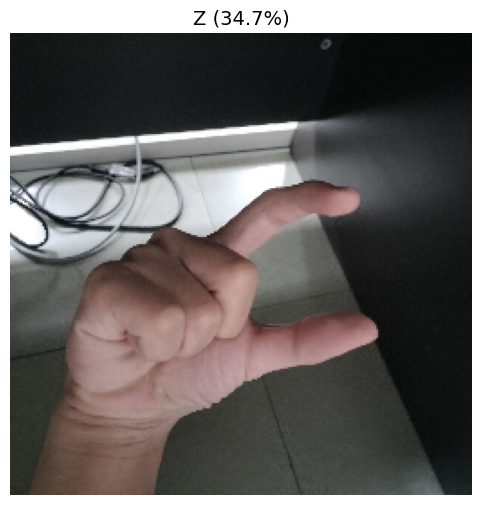

  Probabilities: A=2.7% B=6.3% C=1.7% D=3.2% E=0.1% F=9.1% G=1.4% H=16.5% I=3.9% J=1.2% K=1.4% L=0.3% M=0.5% N=0.5% O=3.4% P=0.4% Q=2.8% R=2.1% S=0.7% T=1.5% U=1.2% V=2.5% W=0.2% X=0.2% Y=1.3% Z=34.7% 

Testing: IMG20251215145002.jpg


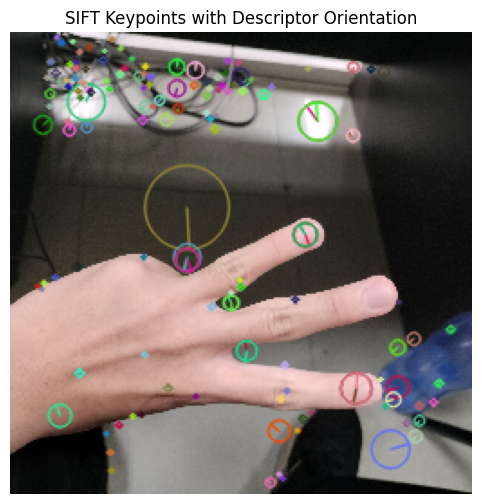

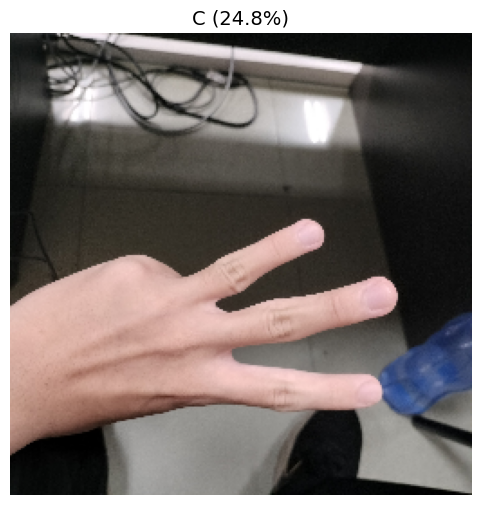

  Probabilities: A=2.7% B=1.2% C=24.8% D=2.3% E=1.7% F=3.0% G=1.5% H=5.4% I=2.1% J=0.6% K=0.9% L=3.5% M=1.4% N=1.8% O=18.9% P=0.4% Q=2.7% R=2.2% S=1.3% T=0.9% U=2.1% V=16.1% W=0.3% X=0.2% Y=0.4% Z=1.6% 

Testing: IMG20251216212711.jpg


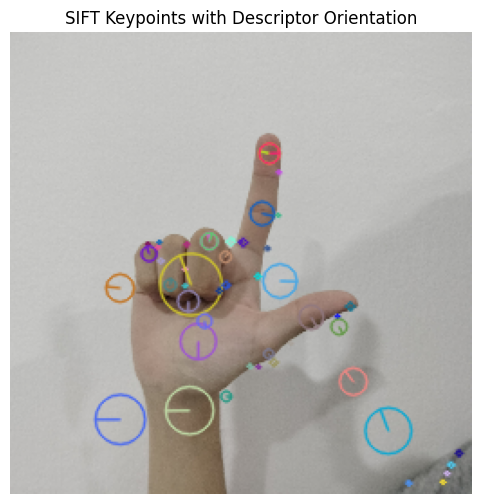

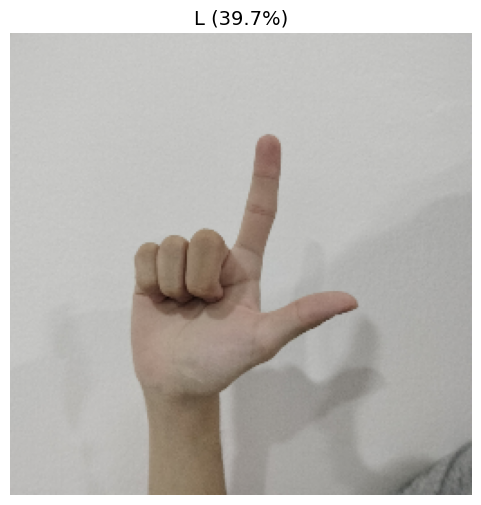

  Probabilities: A=5.9% B=1.1% C=8.1% D=2.3% E=0.1% F=1.3% G=2.6% H=1.7% I=1.6% J=11.1% K=2.2% L=39.7% M=0.9% N=1.9% O=1.4% P=0.3% Q=0.6% R=2.1% S=3.9% T=0.6% U=2.5% V=2.0% W=2.5% X=0.8% Y=0.8% Z=2.2% 

Testing: IMG20251216212714.jpg


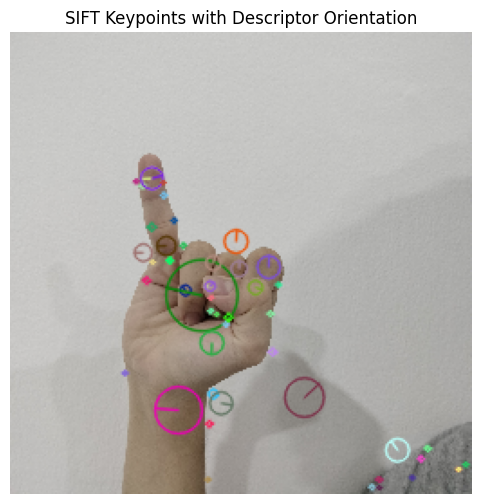

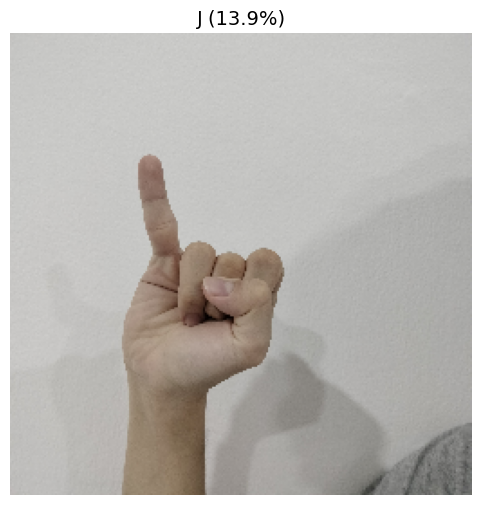

  Probabilities: A=3.8% B=4.2% C=4.5% D=2.2% E=0.2% F=1.9% G=4.2% H=11.7% I=2.9% J=13.9% K=2.6% L=4.0% M=0.5% N=0.9% O=1.1% P=0.7% Q=1.4% R=5.0% S=2.8% T=2.3% U=6.9% V=6.4% W=1.4% X=4.8% Y=7.5% Z=2.3% 

Testing: IMG20251216212724.jpg


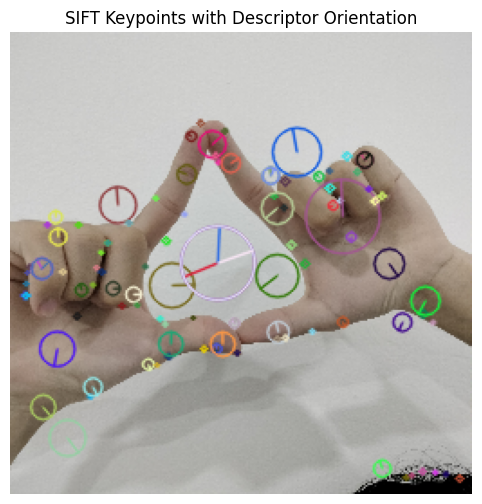

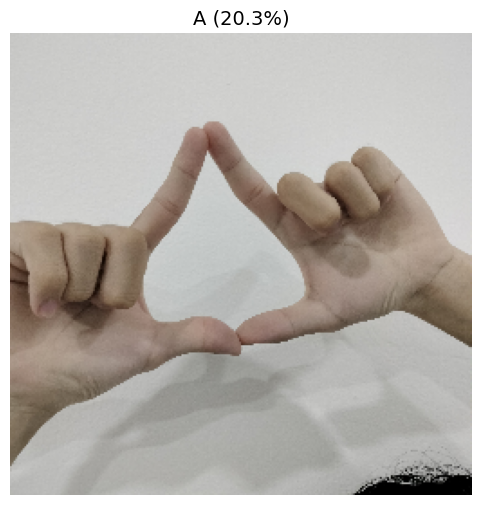

  Probabilities: A=20.3% B=1.4% C=18.4% D=2.6% E=0.1% F=0.3% G=2.0% H=3.7% I=9.0% J=1.6% K=0.7% L=2.4% M=0.3% N=0.5% O=1.0% P=0.3% Q=3.4% R=13.0% S=2.4% T=2.9% U=1.1% V=7.5% W=1.6% X=0.8% Y=0.8% Z=1.9% 

Testing: IMG20251216212739.jpg


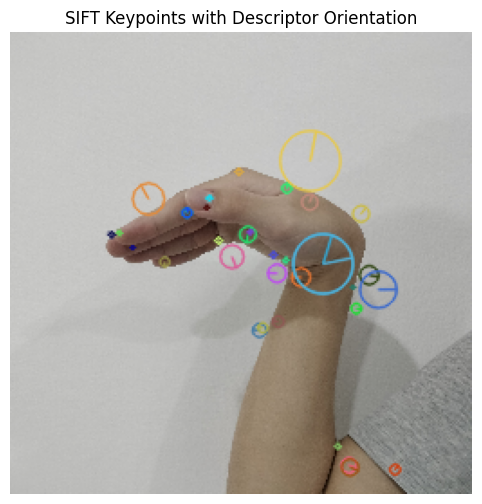

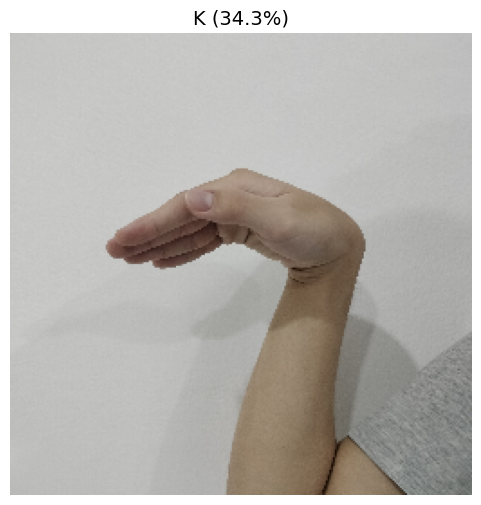

  Probabilities: A=1.5% B=0.7% C=1.2% D=0.4% E=0.2% F=1.1% G=10.3% H=0.7% I=3.6% J=3.2% K=34.3% L=11.0% M=0.2% N=0.2% O=1.0% P=1.3% Q=0.2% R=2.4% S=0.6% T=1.5% U=2.3% V=11.2% W=1.1% X=2.2% Y=1.5% Z=6.0% 

Testing: IMG20251216212741.jpg


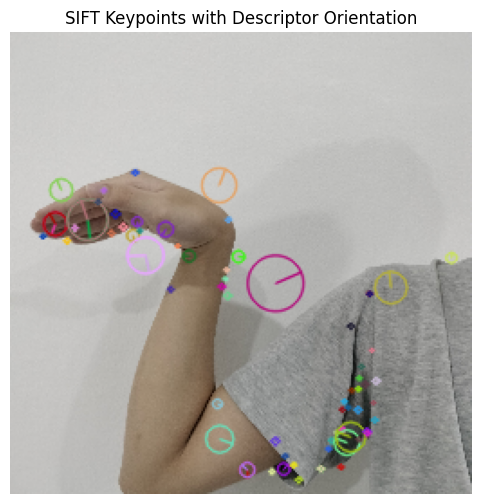

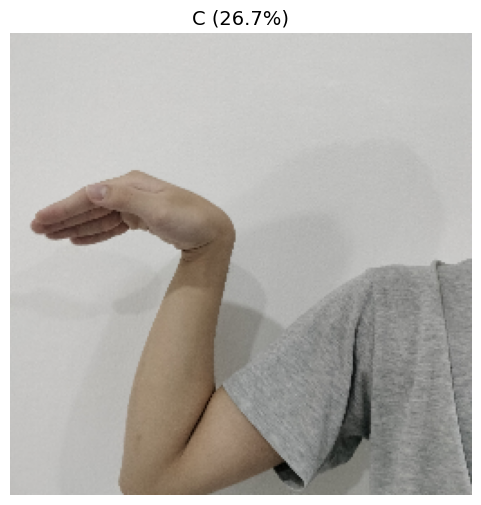

  Probabilities: A=1.1% B=1.5% C=26.7% D=3.7% E=2.2% F=1.6% G=6.1% H=3.8% I=0.6% J=0.7% K=0.4% L=1.4% M=1.0% N=1.2% O=17.1% P=0.2% Q=0.2% R=13.2% S=2.6% T=3.2% U=4.9% V=4.5% W=0.3% X=0.4% Y=0.7% Z=0.6% 

Testing: IMG20251216212835.jpg


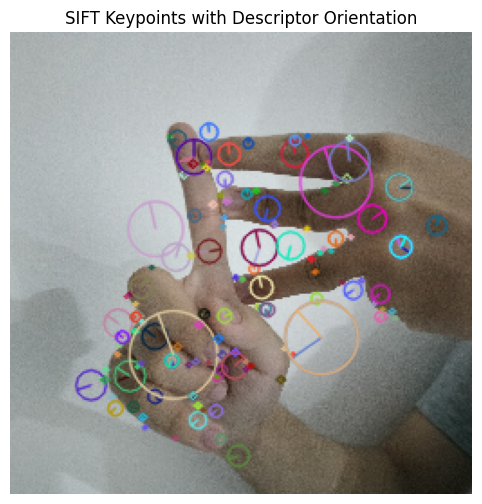

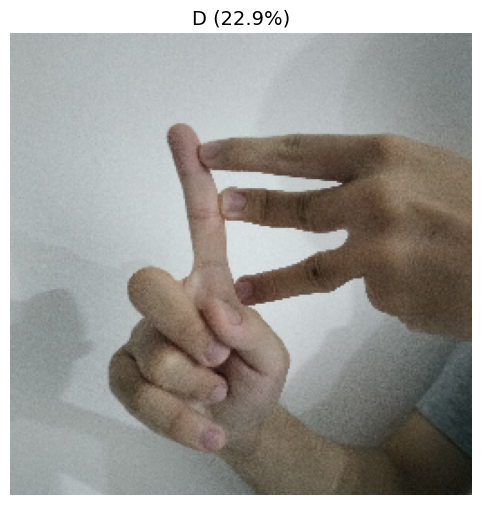

  Probabilities: A=7.6% B=3.9% C=14.6% D=22.9% E=0.1% F=7.9% G=0.3% H=4.7% I=0.4% J=1.3% K=0.3% L=0.4% M=0.1% N=0.3% O=5.4% P=0.5% Q=1.1% R=1.3% S=3.6% T=14.5% U=0.8% V=1.0% W=2.8% X=0.9% Y=1.0% Z=2.4% 

Testing: IMG20251216212849.jpg


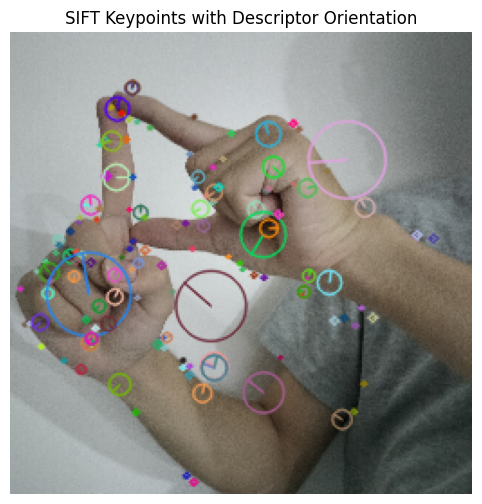

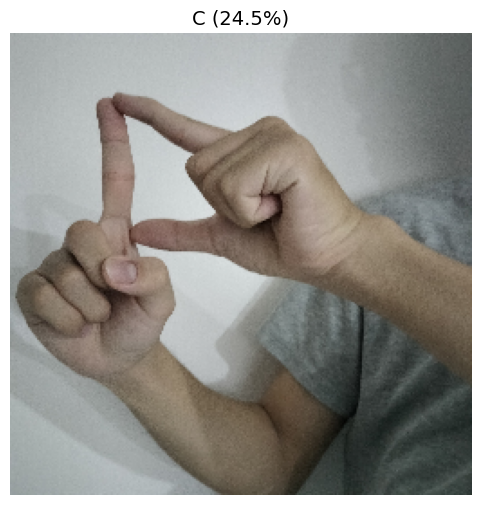

  Probabilities: A=11.7% B=5.7% C=24.5% D=9.5% E=0.1% F=5.3% G=0.1% H=2.0% I=0.6% J=1.0% K=0.1% L=0.6% M=0.2% N=0.6% O=1.8% P=0.1% Q=0.4% R=0.8% S=15.8% T=13.7% U=1.3% V=0.4% W=2.3% X=0.3% Y=0.5% Z=0.7% 

Testing: IMG_20251216_212928.jpg


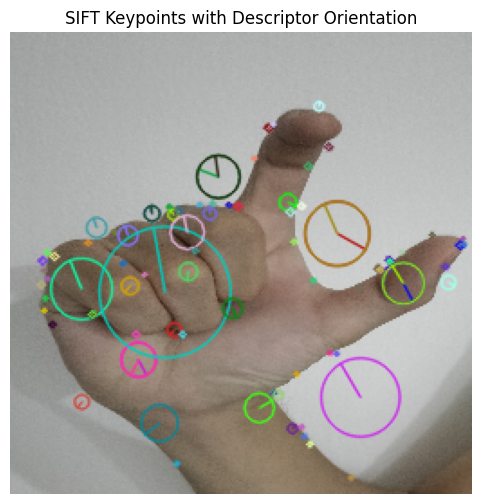

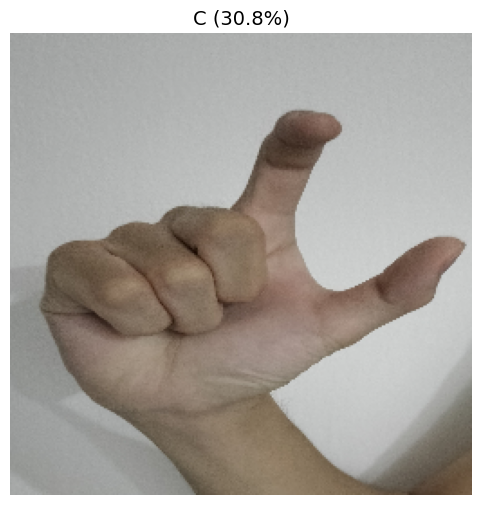

  Probabilities: A=1.7% B=1.5% C=30.8% D=8.4% E=0.7% F=2.0% G=2.4% H=6.6% I=0.6% J=1.2% K=0.3% L=7.0% M=0.2% N=0.4% O=8.7% P=0.3% Q=0.1% R=1.9% S=5.2% T=2.6% U=11.4% V=4.5% W=0.2% X=0.3% Y=0.8% Z=0.2% 

Testing: IMG_20251216_213015.jpg


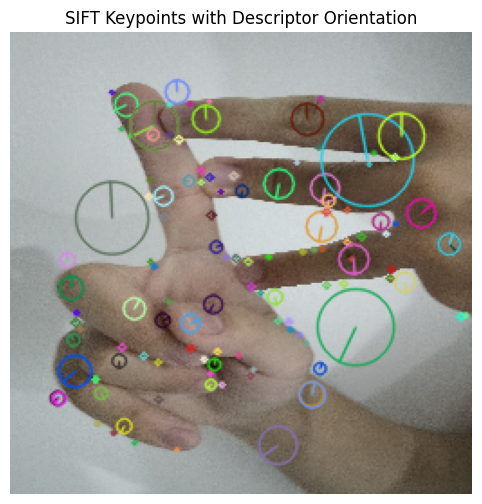

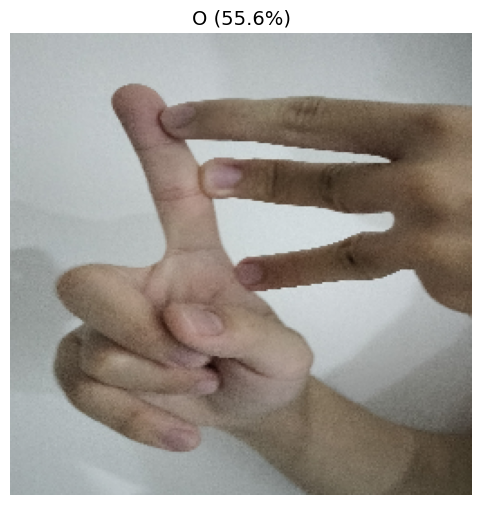

  Probabilities: A=0.6% B=0.8% C=14.3% D=2.8% E=1.1% F=4.2% G=0.6% H=1.3% I=0.2% J=0.5% K=0.2% L=1.1% M=0.2% N=0.3% O=55.6% P=0.2% Q=0.2% R=0.7% S=5.2% T=1.0% U=6.5% V=1.4% W=0.2% X=0.2% Y=0.4% Z=0.2% 


In [154]:
test_path = './test_images/'

for f in os.listdir(test_path):
    filepath = os.path.join(test_path, f)
    if not os.path.isfile(filepath):
        continue
    
    print(f"\nTesting: {f}")
    show_keypoints(filepath)
    classify_image(filepath, descriptor=sift, scaler=scaler_sift, kmeans=kmeans_sift, svc=svc_sift)

## Summary

### Pipeline
**Image → Feature Extraction → BoVW Histogram (for keypoint descriptors) → SVM → Classification**

### Evaluation Methodology
- **K-Fold Cross-Validation**: 5 folds for robust performance estimation
- **Sample Sizes**: 1, 5, 10, 20, 50, 100, and full dataset per class
- **Metrics**: Mean accuracy ± standard deviation

### Feature Descriptors Evaluated
| Descriptor | Type | Description |
|------------|------|-------------|
| SIFT | Keypoint | Scale-Invariant Feature Transform |
| RootSIFT | Keypoint | L1-normalized SIFT with square root |
| AKAZE | Keypoint | Accelerated-KAZE features |
| ORB | Keypoint | Oriented FAST and Rotated BRIEF |
| HOG | Global | Histogram of Oriented Gradients |
| LBP | Global | Local Binary Patterns |

### Output Files
- `accuracy_vs_samples_lineplot.png` - Line plot of accuracy vs sample size
- `descriptor_comparison_barplot.png` - Bar plot comparing descriptors
- `accuracy_heatmap.png` - Heatmap of accuracy by descriptor and sample size
- `cross_validation_results.csv` - Detailed results in CSV format
- `models/*.pkl` - Trained models for each descriptor

### Usage
```python
# Load a trained model
svc, kmeans = load_model('models/rps_classifier_akaze_best.pkl')

# Classify an image
pred_class, confidence = classify_image('path/to/image.jpg', akaze, kmeans, svc)
```